# На участках автомобильных дорог с непрерывным оптическим/радиолокационным покрытием камерами фото- и видеофиксации регистрируется меньшее число ДТП нежели на участках, где такового покрытия нет

Для изучения берем следующие трассы:

- Низкая концентрация камер трасса Р-176 от Киров до Сыктывкара
- Высокая концентрация трасса Р-243 от Кирова до Перми

# Загрузим библиотеки и данные

In [1]:
!pip install catboost
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix, classification_report
from catboost import CatBoostClassifier

import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, roc_auc_score
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
import numpy as np
import folium
import geopandas as gpd
import pandas as pd
import json
import pandas as pd
import urllib.request
from math import radians, sin
from sklearn.tree import export_graphviz
!pip install dtreeviz
import graphviz
import dtreeviz
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import train_test_split
!pip install geopy

**Загрузим данные по ДТП**

In [2]:

#Kirov
url = "https://cms.dtp-stat.ru/media/opendata/kirovskaia-oblast.geojson"

with urllib.request.urlopen(url) as url:
    data = json.loads(url.read().decode())

df_1 = pd.json_normalize(data['features'])
#Perm
url = "https://cms.dtp-stat.ru/media/opendata/permskii-krai.geojson"

with urllib.request.urlopen(url) as url:
    data = json.loads(url.read().decode())

df_2 = pd.json_normalize(data['features'])
#Komi
url = "https://cms.dtp-stat.ru/media/opendata/respublika-komi.geojson"

with urllib.request.urlopen(url) as url:
    data = json.loads(url.read().decode())

df_3 = pd.json_normalize(data['features'])

df = pd.concat([df_1, df_2, df_3])

**Структура данных**

In [3]:
{
    "id": 384094, # идентификатор
    "tags": ["Дорожно-транспортные происшествия"], # показатели с официального сайта ГИБДД
    "light": "Светлое время суток", # время суток
    "point": {"lat": 50.6039, "long": 36.5578}, # координаты
    "nearby": [ "Нерегулируемый перекрёсток неравнозначных улиц (дорог)", "Жилые дома индивидуальной застройки"], # координаты
    "region": "Белгород", # город/район
    "address": "г Белгород, ул Сумская, 30", # адрес
    "weather": ["Ясно"], # погода
    "category": "Столкновение", # тип ДТП
    "datetime": "2017-08-05 13:06:00", # дата и время
    "severity": "Легкий", # тяжесть ДТП/вред здоровью
    "vehicles": [ # участники – транспортные средства
      {
        "year": 2010, # год производства транспортного средства
        "brand": "ВАЗ", # марка транспортного средства
        "color": "Иные цвета", # цвет транспортного средства
        "model": "Priora", # модель транспортного средства
        "category": "С-класс (малый средний, компактный) до 4,3 м", # категория транспортного средства
        "participants": [ # участники внутри транспортных средств
          {
            "role": "Водитель", # роль участника
            "gender": "Женский", # пол участника
            "violations": [], # нарушения правил участником
            "health_status": "Раненый, находящийся...", # состояние здоровья участника
            "years_of_driving_experience": 11 # стаж вождения участника (только у водителей)
          }
        ]
      },
    ],
    "dead_count": 0, # кол-во погибших в ДТП
    "participants": [], # участники без транспортных средств (описание, как у участников внутри транспортных средств)
    "injured_count": 2, # кол-во раненых в ДТП
    "parent_region": "Белгородская область", # регион
    "road_conditions": ["Сухое"], # состояние дорожного покрытия
    "participants_count": 3, # кол-во участников ДТП
    "participant_categories": ["Все участники", "Дети"] # категории участников
  }

{'id': 384094,
 'tags': ['Дорожно-транспортные происшествия'],
 'light': 'Светлое время суток',
 'point': {'lat': 50.6039, 'long': 36.5578},
 'nearby': ['Нерегулируемый перекрёсток неравнозначных улиц (дорог)',
  'Жилые дома индивидуальной застройки'],
 'region': 'Белгород',
 'address': 'г Белгород, ул Сумская, 30',
 'weather': ['Ясно'],
 'category': 'Столкновение',
 'datetime': '2017-08-05 13:06:00',
 'severity': 'Легкий',
 'vehicles': [{'year': 2010,
   'brand': 'ВАЗ',
   'color': 'Иные цвета',
   'model': 'Priora',
   'category': 'С-класс (малый средний, компактный) до 4,3 м',
   'participants': [{'role': 'Водитель',
     'gender': 'Женский',
     'violations': [],
     'health_status': 'Раненый, находящийся...',
     'years_of_driving_experience': 11}]}],
 'dead_count': 0,
 'participants': [],
 'injured_count': 2,
 'parent_region': 'Белгородская область',
 'road_conditions': ['Сухое'],
 'participants_count': 3,
 'participant_categories': ['Все участники', 'Дети']}

**Загрузим данные по камерам**

In [4]:
milestones = pd.read_csv('milestones_new.csv', sep=';')

# Исследуем данные

**Датасет с ДТП**

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46050 entries, 0 to 8266
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   type                               46050 non-null  object 
 1   geometry.type                      46050 non-null  object 
 2   geometry.coordinates               46050 non-null  object 
 3   properties.id                      46050 non-null  int64  
 4   properties.tags                    46050 non-null  object 
 5   properties.light                   46050 non-null  object 
 6   properties.point.lat               45303 non-null  float64
 7   properties.point.long              45303 non-null  float64
 8   properties.nearby                  46050 non-null  object 
 9   properties.region                  46050 non-null  object 
 10  properties.scheme                  44344 non-null  object 
 11  properties.address                 43798 non-null  obje

In [6]:
df

,type,geometry.type,geometry.coordinates,properties.id,properties.tags,properties.light,properties.point.lat,properties.point.long,properties.nearby,properties.region,...,properties.datetime,properties.severity,properties.vehicles,properties.dead_count,properties.participants,properties.injured_count,properties.parent_region,properties.road_conditions,properties.participants_count,properties.participant_categories
0,Feature,Point,"[47.875934, 57.300339]",1986311,"[Дорожно-транспортные происшествия, ДТП и пост...","В темное время суток, освещение включено",57.300339,47.875934,[Нерегулируемый перекрёсток неравнозначных ули...,Яранский район,...,2016-09-02 21:30:00,С погибшими,"[{'year': 2007, 'brand': 'HYUNDAI', 'color': '...",1,[],1,Кировская область,[Сухое],5,"[Велосипедисты, Дети, Все участники]"
1,Feature,Point,"[47.875603, 57.24379]",1983180,[Дорожно-транспортные происшествия],Светлое время суток,57.243790,47.875603,[],Яранский район,...,2017-07-01 18:00:00,Легкий,"[{'year': 2005, 'brand': 'ГАЗ', 'color': 'Белы...",0,[],1,Кировская область,[Мокрое],3,[Все участники]
2,Feature,Point,"[47.840781, 57.297156]",2591208,[Дорожно-транспортные происшествия],Сумерки,57.297156,47.840781,"[Жилые дома индивидуальной застройки, Нерегули...",Яранский район,...,2021-07-02 21:25:00,Легкий,"[{'year': 2005, 'brand': 'CHEVROLET', 'color':...",0,[],1,Кировская область,[Мокрое],1,[Все участники]
3,Feature,Point,"[47.834365, 57.244775]",2577639,[Дорожно-транспортные происшествия],Светлое время суток,57.244775,47.834365,[Жилые дома индивидуальной застройки],Яранский район,...,2021-05-31 18:55:00,Легкий,"[{'year': 2017, 'brand': 'RENAULT', 'color': '...",0,[],1,Кировская область,[Сухое],2,"[Мотоциклисты, Все участники]"
4,Feature,Point,"[47.968197, 57.357738]",1981026,[Дорожно-транспортные происшествия],Светлое время суток,57.357738,47.968197,[Нерегулируемый перекрёсток неравнозначных ули...,Яранский район,...,2018-05-16 16:25:00,Легкий,"[{'year': 2006, 'brand': 'ВАЗ', 'color': 'Зеле...",0,[],2,Кировская область,"[Сухое, Отсутствие, плохая различимость горизо...",2,[Все участники]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8262,Feature,Point,"[50.843056, 61.6625]",1894624,[Дорожно-транспортные происшествия],Светлое время суток,61.662500,50.843056,"[Жилые дома индивидуальной застройки, Нерегули...",Сыктывкар,...,2015-09-26 13:25:00,Легкий,"[{'year': 2013, 'brand': 'MERCEDES', 'color': ...",0,[],2,Республика Коми,"[Сухое, Отсутствие, плохая различимость горизо...",3,[Все участники]
8263,Feature,Point,"[50.733056, 61.783056]",1894640,[Дорожно-транспортные происшествия],Светлое время суток,61.783056,50.733056,"[Производственное предприятие, Административны...",Сыктывкар,...,2015-09-18 16:10:00,Тяжёлый,"[{'year': 1974, 'brand': 'ВАЗ', 'color': 'Зеле...",0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,Республика Коми,[Мокрое],2,"[Пешеходы, Все участники]"
8264,Feature,Point,"[50.819167, 61.663333]",1894647,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",61.663333,50.819167,"[Многоквартирные жилые дома, Административные ...",Сыктывкар,...,2015-09-11 20:46:00,Легкий,"[{'year': 2002, 'brand': 'ВАЗ', 'color': 'Фиол...",0,[],1,Республика Коми,[Мокрое],3,[Все участники]
8265,Feature,Point,"[50.855649, 61.665822]",1893156,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",61.665822,50.855649,"[Административные здания, Остановка общественн...",Сыктывкар,...,2019-12-03 04:40:00,Легкий,"[{'year': 2018, 'brand': 'ВАЗ', 'color': 'Сини...",0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,Республика Коми,[Обработанное противогололедными материалами],2,"[Пешеходы, Все участники]"


**Датасет с камерами**

In [7]:
milestones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44636 entries, 0 to 44635
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   camera_id     44636 non-null  int64  
 1   region_code   44636 non-null  int64  
 2   src_camera    44636 non-null  object 
 3   serial_no     44636 non-null  object 
 4   print_name    44633 non-null  object 
 5   camera_model  44636 non-null  object 
 6   complex_id    44636 non-null  int64  
 7   camera_place  44636 non-null  object 
 8   gps_x         44636 non-null  float64
 9   gps_y         44636 non-null  float64
 10  violname      44636 non-null  object 
dtypes: float64(2), int64(3), object(6)
memory usage: 3.7+ MB


In [8]:
milestones

,camera_id,region_code,src_camera,serial_no,print_name,camera_model,complex_id,camera_place,gps_x,gps_y,violname
0,800000000000001881,1180,LBS12440-LBL12441-GBT21100062,LBS12440-LBL12441,LBS12440-LBL12441-GBT21100062,ЛОБАЧЕВСКИЙ,1779,"а/д Стерлитамак-Белорецк-Магнитогорск, 209 км...",58.153570,53.895721,административные правонарушения в области доро...
1,820000000000001168,1182,Alyaska30cSulak,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.444150,43.025890,административные правонарушения в области доро...
2,820000000000001170,1182,Alyaska30aKrasnoarmeisk,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.443868,43.025509,административные правонарушения в области доро...
3,820000000000001169,1182,Alyaska30bMahachkala,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.443720,43.025200,административные правонарушения в области доро...
4,730010000000000750,1173,ПСМ-Л1712028,ПСМ-Л1712028,ПТОЛЕМЕЙ-СМ_1712028,ПТОЛЕМЕЙ-СМ,746,"ул.Куйбышева, д.226, г. Димитровград, Ульяновс...",49.614759,54.225865,административные правонарушения в области доро...
...,...,...,...,...,...,...,...,...,...,...,...
44631,930000000000000768,1193,VNB200017K,P161,P161,Вокорд-Трафик Р,740,на пересечении улиц Кочетова - Интернациональн...,94.448430,51.720280,административные правонарушения в области доро...
44632,930000000000000767,1193,VNB210004K,P161,P161,Вокорд-Трафик Р,740,на пересечении улиц Кочетова - Интернациональн...,94.448430,51.720280,административные правонарушения в области доро...
44633,110000000000001188,1111,Z-35-18-8,35-18,35-18-8,Азимут 2,706,"Перекресток ул.Советская; ул.Терехина, г. Арха...",40.515303,64.578284,административные правонарушения в области доро...
44634,850000000000000786,1185,018-235,018-235,018-235,Автодория 3.5,748,"Региональная а/д ""Садовое - Абганерово"" км 0+2...",44.511139,47.774349,административные правонарушения в области доро...


# Преобразуем данные

**Разнесем координаты по разным столбцам для удобства**

In [9]:
# Функция для извлечения значений координат
def extract_coordinates(row):
    lon, lat = row['geometry.coordinates']
    return pd.Series({'longitude': lon, 'latitude': lat})

# Применение функции к столбцу 'geometry.coordinates'
df[['longitude', 'latitude']] = df.apply(extract_coordinates, axis=1)

# Вывод результата
df


,type,geometry.type,geometry.coordinates,properties.id,properties.tags,properties.light,properties.point.lat,properties.point.long,properties.nearby,properties.region,...,properties.vehicles,properties.dead_count,properties.participants,properties.injured_count,properties.parent_region,properties.road_conditions,properties.participants_count,properties.participant_categories,longitude,latitude
0,Feature,Point,"[47.875934, 57.300339]",1986311,"[Дорожно-транспортные происшествия, ДТП и пост...","В темное время суток, освещение включено",57.300339,47.875934,[Нерегулируемый перекрёсток неравнозначных ули...,Яранский район,...,"[{'year': 2007, 'brand': 'HYUNDAI', 'color': '...",1,[],1,Кировская область,[Сухое],5,"[Велосипедисты, Дети, Все участники]",47.875934,57.300339
1,Feature,Point,"[47.875603, 57.24379]",1983180,[Дорожно-транспортные происшествия],Светлое время суток,57.243790,47.875603,[],Яранский район,...,"[{'year': 2005, 'brand': 'ГАЗ', 'color': 'Белы...",0,[],1,Кировская область,[Мокрое],3,[Все участники],47.875603,57.243790
2,Feature,Point,"[47.840781, 57.297156]",2591208,[Дорожно-транспортные происшествия],Сумерки,57.297156,47.840781,"[Жилые дома индивидуальной застройки, Нерегули...",Яранский район,...,"[{'year': 2005, 'brand': 'CHEVROLET', 'color':...",0,[],1,Кировская область,[Мокрое],1,[Все участники],47.840781,57.297156
3,Feature,Point,"[47.834365, 57.244775]",2577639,[Дорожно-транспортные происшествия],Светлое время суток,57.244775,47.834365,[Жилые дома индивидуальной застройки],Яранский район,...,"[{'year': 2017, 'brand': 'RENAULT', 'color': '...",0,[],1,Кировская область,[Сухое],2,"[Мотоциклисты, Все участники]",47.834365,57.244775
4,Feature,Point,"[47.968197, 57.357738]",1981026,[Дорожно-транспортные происшествия],Светлое время суток,57.357738,47.968197,[Нерегулируемый перекрёсток неравнозначных ули...,Яранский район,...,"[{'year': 2006, 'brand': 'ВАЗ', 'color': 'Зеле...",0,[],2,Кировская область,"[Сухое, Отсутствие, плохая различимость горизо...",2,[Все участники],47.968197,57.357738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8262,Feature,Point,"[50.843056, 61.6625]",1894624,[Дорожно-транспортные происшествия],Светлое время суток,61.662500,50.843056,"[Жилые дома индивидуальной застройки, Нерегули...",Сыктывкар,...,"[{'year': 2013, 'brand': 'MERCEDES', 'color': ...",0,[],2,Республика Коми,"[Сухое, Отсутствие, плохая различимость горизо...",3,[Все участники],50.843056,61.662500
8263,Feature,Point,"[50.733056, 61.783056]",1894640,[Дорожно-транспортные происшествия],Светлое время суток,61.783056,50.733056,"[Производственное предприятие, Административны...",Сыктывкар,...,"[{'year': 1974, 'brand': 'ВАЗ', 'color': 'Зеле...",0,"[{'role': 'Пешеход', 'gender': 'Женский', 'vio...",1,Республика Коми,[Мокрое],2,"[Пешеходы, Все участники]",50.733056,61.783056
8264,Feature,Point,"[50.819167, 61.663333]",1894647,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",61.663333,50.819167,"[Многоквартирные жилые дома, Административные ...",Сыктывкар,...,"[{'year': 2002, 'brand': 'ВАЗ', 'color': 'Фиол...",0,[],1,Республика Коми,[Мокрое],3,[Все участники],50.819167,61.663333
8265,Feature,Point,"[50.855649, 61.665822]",1893156,[Дорожно-транспортные происшествия],"В темное время суток, освещение включено",61.665822,50.855649,"[Административные здания, Остановка общественн...",Сыктывкар,...,"[{'year': 2018, 'brand': 'ВАЗ', 'color': 'Сини...",0,"[{'role': 'Пешеход', 'gender': 'Мужской', 'vio...",1,Республика Коми,[Обработанное противогололедными материалами],2,"[Пешеходы, Все участники]",50.855649,61.665822


In [10]:
df['properties.datetime'] = df['properties.datetime'].astype('datetime64')
df['year'] = df['properties.datetime'].dt.year

In [11]:
df = df[(df['year'] == 2021) | (df['year'] == 2022) | (df['year'] == 2023)]

In [12]:
milestones

,camera_id,region_code,src_camera,serial_no,print_name,camera_model,complex_id,camera_place,gps_x,gps_y,violname
0,800000000000001881,1180,LBS12440-LBL12441-GBT21100062,LBS12440-LBL12441,LBS12440-LBL12441-GBT21100062,ЛОБАЧЕВСКИЙ,1779,"а/д Стерлитамак-Белорецк-Магнитогорск, 209 км...",58.153570,53.895721,административные правонарушения в области доро...
1,820000000000001168,1182,Alyaska30cSulak,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.444150,43.025890,административные правонарушения в области доро...
2,820000000000001170,1182,Alyaska30aKrasnoarmeisk,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.443868,43.025509,административные правонарушения в области доро...
3,820000000000001169,1182,Alyaska30bMahachkala,Alyaska30cSulak,АвтоУраган Аляска-30,АвтоУраган Аляска-30,959,"КПП ""Аляска-30"" (Утепский пост) а/д ""Астрахань...",47.443720,43.025200,административные правонарушения в области доро...
4,730010000000000750,1173,ПСМ-Л1712028,ПСМ-Л1712028,ПТОЛЕМЕЙ-СМ_1712028,ПТОЛЕМЕЙ-СМ,746,"ул.Куйбышева, д.226, г. Димитровград, Ульяновс...",49.614759,54.225865,административные правонарушения в области доро...
...,...,...,...,...,...,...,...,...,...,...,...
44631,930000000000000768,1193,VNB200017K,P161,P161,Вокорд-Трафик Р,740,на пересечении улиц Кочетова - Интернациональн...,94.448430,51.720280,административные правонарушения в области доро...
44632,930000000000000767,1193,VNB210004K,P161,P161,Вокорд-Трафик Р,740,на пересечении улиц Кочетова - Интернациональн...,94.448430,51.720280,административные правонарушения в области доро...
44633,110000000000001188,1111,Z-35-18-8,35-18,35-18-8,Азимут 2,706,"Перекресток ул.Советская; ул.Терехина, г. Арха...",40.515303,64.578284,административные правонарушения в области доро...
44634,850000000000000786,1185,018-235,018-235,018-235,Автодория 3.5,748,"Региональная а/д ""Садовое - Абганерово"" км 0+2...",44.511139,47.774349,административные правонарушения в области доро...


In [13]:
milestones = milestones[milestones["camera_place"].str.contains("Киров|Перм|Коми")]

In [14]:
df = df.dropna()

----------------

In [15]:
df_coords = pd.read_json('ors-route_1681383229459.json')
distance_r_176 = df_coords['features'][0]['properties']['segments'][0]['distance']
df_coords = df_coords['features'][0]['geometry']['coordinates']

lons = [coord[0] for coord in df_coords]
lats = [coord[1] for coord in df_coords]

df_coords = pd.DataFrame({'lon': lons, 'lat': lats})
print(df_coords)


            lon        lat
0     49.470284  58.802263
1     49.470183  58.802423
2     49.469377  58.803692
3     49.468949  58.804365
4     49.468903  58.804437
...         ...        ...
1019  50.584479  61.481334
1020  50.584536  61.482264
1021  50.584481  61.483089
1022  50.584363  61.483782
1023  50.583384  61.486732

[1024 rows x 2 columns]


# Трасса Р-176 Киров-Сыктывкар

In [16]:
years = list(df.year.unique())
years

[2021, 2022, 2023]

In [17]:
import geopy
import geopy.distance

In [18]:

# Создаем геодатафрейм для создания центроидов
geometry = gpd.points_from_xy(df_coords.lon, df_coords.lat)
gdf = gpd.GeoDataFrame(df_coords, geometry=geometry)

# Создаем геодатафрейм для df
df_geometry = gpd.points_from_xy(df.longitude, df.latitude)
df_geometry_gdf = gpd.GeoDataFrame(df, geometry=df_geometry)

# Создаем геодатафрейм для milestones
milestones_geometry = gpd.points_from_xy(milestones.gps_x, milestones.gps_y)
milestones_gdf = gpd.GeoDataFrame(milestones, geometry=milestones_geometry)


# Определяем количество кластеров для создания
# количество кластеров зависит от расстояния между центроидами,
# задаем минимальное расстояние между центроидами равным 1 км
# коэффициент преобразования градусов в километры примерно равен 111
k = 100

# Создаем модель KMeans
kmeans = KMeans(n_clusters=k)

# Обучаем модель на координатах
kmeans.fit(gdf[['lon', 'lat']])

# Находим ближайшие точки к центроидам
closest_points, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, gdf[['lon', 'lat']])

# Получаем центроиды
centroids = gdf.iloc[closest_points]




results = []
# Создаем карту
m = folium.Map(location=[centroids['lat'].mean(), centroids['lon'].mean()], zoom_start=8)
# рассчет


for y in years:
    count = 0
    for _, row in centroids.iterrows():
      # Определяем координаты квадрата, в котором будем искать точки
      xmin, ymin, xmax, ymax = row['lon'] - 0.02, row['lat'] - 0.02, row['lon'] + 0.02, row['lat'] + 0.02

      # Выбираем дтп
      points = df_geometry_gdf[df_geometry_gdf.year == y].cx[xmin:xmax, ymin:ymax]
      

      # Выбираем зеленые точки, которые попадают в красный квадрат
      milestones_points = milestones_gdf.cx[xmin:xmax, ymin:ymax]
      # Подсчитываем количество точек
      num_points = points.shape[0]

      # Подсчитываем количество зеленых точек в красном квадрате
      num_milestones_points = milestones_points.shape[0]
      count +=1

      results.append([count, num_points, num_milestones_points, y])


    # блок отображения на карте

      folium.Rectangle(
          bounds=[(ymin, xmin), (ymax, xmax)],
          radius=4,
          color='red',
          fill=False,
          weight=1
      ).add_to(m)

# Отображаем все точки на карте
for _, row in df.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=2, color='blue', fill=True).add_to(m)

# Отображаем зеленые точки на карте, которые попадают в красный квадрат
for _, row in milestones.iterrows():
    folium.CircleMarker(location=[row['gps_y'], row['gps_x']], radius=2, color='orange', fill=True).add_to(m)

# расчет расстояний между точками в метрах
dist_lat = geopy.distance.distance((ymin, xmin), (ymax, xmin)).meters
dist_lon = geopy.distance.distance((ymin, xmin), (ymin, xmax)).meters

# расчет площади прямоугольника
R = 6371  # радиус Земли в км
area = R ** 2 * abs(sin(radians(ymax)) - sin(radians(ymin))) * radians(xmax - xmin)

print("Площадь прямоугольника:", round(area, 2), "км^2")
print("Ширина прямоугольника:", round(dist_lon / 1000, 2), "км")
print("Высота прямоугольника:", round(dist_lat / 1000, 2), "км")

/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


Площадь прямоугольника: 9.82 км^2
Ширина прямоугольника: 2.22 км
Высота прямоугольника: 4.46 км


In [19]:
m

In [20]:
trassa_r176 = pd.DataFrame(data=results, columns=['номер_кластера', 'количество_дтп', 'количество_камер', 'год'])
trassa_r176

,номер_кластера,количество_дтп,количество_камер,год
0,1,0,0,2021
1,2,0,0,2021
2,3,1,0,2021
3,4,1,0,2021
4,5,4,0,2021
...,...,...,...,...
295,96,0,0,2023
296,97,0,0,2023
297,98,0,1,2023
298,99,0,2,2023


In [21]:
trassa_r176[['количество_дтп', 'количество_камер']].sum()

количество_дтп      153
количество_камер     18
dtype: int64

In [22]:
distance_r_176

354.019

-------------------

In [23]:
df_coords = pd.read_json('ors-route_r243.json')
distance_r_243 = df_coords['features'][0]['properties']['segments'][0]['distance']
df_coords = df_coords['features'][0]['geometry']['coordinates']

lons = [coord[0] for coord in df_coords]
lats = [coord[1] for coord in df_coords]

df_coords = pd.DataFrame({'lon': lons, 'lat': lats})
print(df_coords)


            lon        lat
0     49.868310  58.648378
1     49.868905  58.648499
2     49.870241  58.648798
3     49.872109  58.649215
4     49.871707  58.649510
...         ...        ...
2819  55.845479  58.056856
2820  55.845390  58.056555
2821  55.845379  58.056482
2822  55.844761  58.056306
2823  55.844570  58.056403

[2824 rows x 2 columns]


# Трасса Р-243 от Кирова до Перми

In [24]:

# Создаем геодатафрейм для создания центроидов
geometry = gpd.points_from_xy(df_coords.lon, df_coords.lat)
gdf = gpd.GeoDataFrame(df_coords, geometry=geometry)

# Создаем геодатафрейм для df
df_geometry = gpd.points_from_xy(df.longitude, df.latitude)
df_geometry_gdf = gpd.GeoDataFrame(df, geometry=df_geometry)

# Создаем геодатафрейм для milestones
milestones_geometry = gpd.points_from_xy(milestones.gps_x, milestones.gps_y)
milestones_gdf = gpd.GeoDataFrame(milestones, geometry=milestones_geometry)


# Определяем количество кластеров для создания
# количество кластеров зависит от расстояния между центроидами,
# задаем минимальное расстояние между центроидами равным 1 км
# коэффициент преобразования градусов в километры примерно равен 111
k = 100

# Создаем модель KMeans
kmeans = KMeans(n_clusters=k)

# Обучаем модель на координатах
kmeans.fit(gdf[['lon', 'lat']])

# Находим ближайшие точки к центроидам
closest_points, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, gdf[['lon', 'lat']])

# Получаем центроиды
centroids = gdf.iloc[closest_points]




results = []
# Создаем карту
m = folium.Map(location=[centroids['lat'].mean(), centroids['lon'].mean()], zoom_start=8)
# рассчет


for y in years:
    count = 0
    for _, row in centroids.iterrows():
      # Определяем координаты квадрата, в котором будем искать точки
      xmin, ymin, xmax, ymax = row.lon - 0.04, row.lat - 0.01, row.lon + 0.04, row.lat + 0.01
      rectangle = [[ymin, xmin], [ymin, xmax], [ymax, xmax], [ymax, xmin], [ymin, xmin]]

      # Выбираем дтп
      points = df_geometry_gdf[df_geometry_gdf.year == y].cx[xmin:xmax, ymin:ymax]
      

      # Выбираем зеленые точки, которые попадают в красный квадрат
      milestones_points = milestones_gdf.cx[xmin:xmax, ymin:ymax]
      # Подсчитываем количество точек
      num_points = points.shape[0]

      # Подсчитываем количество зеленых точек в красном квадрате
      num_milestones_points = milestones_points.shape[0]
      count +=1

      results.append([count, num_points, num_milestones_points, y])


    # блок отображения на карте

      folium.Rectangle(
          bounds=[(ymin, xmin), (ymax, xmax)],
          radius=4,
          color='red',
          fill=False,
          weight=1
      ).add_to(m)

# Отображаем все точки на карте
for _, row in df.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=2, color='blue', fill=True).add_to(m)

# Отображаем зеленые точки на карте, которые попадают в красный квадрат
for _, row in milestones.iterrows():
    folium.CircleMarker(location=[row['gps_y'], row['gps_x']], radius=2, color='orange', fill=True).add_to(m)


# расчет расстояний между точками в метрах
dist_lat = geopy.distance.distance((ymin, xmin), (ymax, xmin)).meters
dist_lon = geopy.distance.distance((ymin, xmin), (ymin, xmax)).meters

# расчет площади прямоугольника
R = 6371  # радиус Земли в км
area = R ** 2 * abs(sin(radians(ymax)) - sin(radians(ymin))) * radians(xmax - xmin)

print("Площадь прямоугольника:", round(area, 2), "км^2")
print("Ширина прямоугольника:", round(dist_lon / 1000, 2), "км")
print("Высота прямоугольника:", round(dist_lat / 1000, 2), "км")

/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


Площадь прямоугольника: 10.32 км^2
Ширина прямоугольника: 4.66 км
Высота прямоугольника: 2.23 км


In [25]:
m

In [26]:
trassa_r243 = pd.DataFrame(data=results, columns=['номер_кластера', 'количество_дтп', 'количество_камер', 'год'])
trassa_r243

,номер_кластера,количество_дтп,количество_камер,год
0,1,4,0,2021
1,2,2,0,2021
2,3,1,0,2021
3,4,8,0,2021
4,5,0,0,2021
...,...,...,...,...
295,96,0,0,2023
296,97,2,0,2023
297,98,0,0,2023
298,99,0,0,2023


In [27]:
trassa_r243[['количество_дтп', 'количество_камер']].sum()

количество_дтп      399
количество_камер     72
dtype: int64

In [28]:
distance_r_243

445.36

# Проверка гипотезы

In [29]:

r176 = trassa_r176.groupby('номер_кластера')['количество_дтп', 'количество_камер'].sum()\
.reset_index()\
.copy()

r176['is_r176'] = 1
r176['has_accident'] = r176['количество_дтп'].apply(lambda x: 1 if x > 0 else 0)

r243 = trassa_r243.groupby('номер_кластера')['количество_дтп', 'количество_камер'].sum()\
.reset_index()\
.copy()

r243['is_r176'] = 0
r243['has_accident'] = r243['количество_дтп'].apply(lambda x: 1 if x > 0 else 0)

data = pd.concat([r176, r243])

X = data[['количество_камер', 'is_r176']]
y = data['has_accident']

/tmp/ipykernel_7936/2546855536.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
/tmp/ipykernel_7936/2546855536.py:8: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


In [30]:
data

,номер_кластера,количество_дтп,количество_камер,is_r176,has_accident
0,1,2,0,1,1
1,2,0,0,1,0
2,3,3,0,1,1
3,4,2,0,1,1
4,5,7,0,1,1
...,...,...,...,...,...
95,96,1,0,0,1
96,97,12,0,0,1
97,98,0,0,0,0
98,99,2,0,0,1


# Cтат значимость

In [31]:
from scipy.stats import ttest_ind
import pandas as pd

data1 = trassa_r176
data2 = trassa_r243

# объединяем два датасета
data_test = pd.concat([data1, data2])

# разделяем данные на две группы: с камерами и без
dtps_with_cameras = data_test[data_test['количество_камер'] > 0]['количество_дтп']
dtps_without_cameras = data_test[data_test['количество_камер'] == 0]['количество_дтп']

# применяем t-тест
t_stat, p_value = ttest_ind(dtps_with_cameras, dtps_without_cameras)

# выводим результаты
print("t-statistic:", t_stat)
print("p-value:", p_value)

if p_value < 0.05:
    print("Гипотеза подтверждена: на участках с камерами фото- и видеофиксации зарегистрировано меньше ДТП")
else:
    print("Гипотеза не подтверждена")


t-statistic: 10.573820657750202
p-value: 4.5072169598652565e-24
Гипотеза подтверждена: на участках с камерами фото- и видеофиксации зарегистрировано меньше ДТП


# Дерево решений + случайный лес + градиентный бустинг из коробки

In [32]:
# разделяем данные на тренировочный и тестовый наборы
train_data, test_data = train_test_split(data, train_size=0.7, random_state=42)

# определяем целевую переменную и признаки
target = 'has_accident'
features = ['количество_камер']

In [33]:


# список моделей и их параметров
models = [    {'name': 'DecisionTreeClassifier', 'model': DecisionTreeClassifier(random_state=42)},    {'name': 'RandomForestClassifier', 'model': RandomForestClassifier(random_state=42)},    {'name': 'LogisticRegression', 'model': LogisticRegression(random_state=42)},    {'name': 'CatBoostClassifier', 'model': CatBoostClassifier(random_state=42, verbose=False)}]

# список для хранения метрик каждой модели
metrics = []

# обучаем каждую модель, делаем предсказания на тестовых данных и вычисляем метрики
for m in models:
    model = m['model']
    model.fit(train_data[features], train_data[target])
    predictions = model.predict(test_data[features])
    accuracy = accuracy_score(test_data[target], predictions)
    precision = precision_score(test_data[target], predictions)
    recall = recall_score(test_data[target], predictions)
    f1 = f1_score(test_data[target], predictions)
    roc_auc = roc_auc_score(test_data[target], predictions)
    metrics.append({'Model': m['name'], 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall, 'F1 Score': f1, 'ROC AUC Score': roc_auc})

# создаем датафрейм с метриками для всех моделей
metrics_df = pd.DataFrame(metrics)

metrics_df


,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC Score
0,DecisionTreeClassifier,0.65,0.65,1.0,0.787879,0.5
1,RandomForestClassifier,0.65,0.65,1.0,0.787879,0.5
2,LogisticRegression,0.65,0.65,1.0,0.787879,0.5
3,CatBoostClassifier,0.65,0.65,1.0,0.787879,0.5


# Логистическая регрессия с бутстреп

In [34]:
from sklearn.model_selection import GridSearchCV
from sklearn.utils import resample
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)

target = 'has_accident'
features = ['количество_камер', 'is_r176']

# задаем гиперпараметры для подбора
param_grid = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}
model = LogisticRegression(random_state=42)
# создаем объект GridSearchCV
grid_search = GridSearchCV(model, param_grid, cv=5)

# подбираем гиперпараметры на тренировочных данных
grid_search.fit(train_data[features], train_data[target])

# получаем лучшую модель и ее гиперпараметры
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# делаем предсказания на тестовых данных с помощью лучшей модели
predictions = best_model.predict(test_data[features])

# создаем список метрик
metrics_list = [accuracy_score, precision_score, recall_score, f1_score, roc_auc_score]

# создаем пустой список для метрик
metrics_values = []

# задаем количество бутстреп-проб
n_bootstrap = 500

# проводим бутстреп
for i in range(n_bootstrap):
    # берем случайные выборки из тренировочных данных с возвращением
    bootstrap_train_data = resample(train_data, replace=True, random_state=i, n_samples=100)
    
    # обучаем модель на случайной выборке
    model.fit(bootstrap_train_data[features], bootstrap_train_data[target])
    
    # делаем предсказания на тестовых данных
    bootstrap_predictions = model.predict(test_data[features])
    
    # вычисляем метрики на предсказаниях
    bootstrap_metrics = [metric(test_data[target], bootstrap_predictions) for metric in metrics_list]
    
    # добавляем метрики в список метрик
    metrics_values.append(bootstrap_metrics)

# вычисляем среднее и доверительный интервал для каждой метрики
metrics = pd.DataFrame()
for i, metric in enumerate(metrics_list):
    metric_values = [row[i] for row in metrics_values]
    mean_value = np.mean(metric_values)
    ci_low, ci_high = np.percentile(metric_values, [2.5, 97.5])
    metrics = metrics.append({'Metric': metric.__name__, 'Mean Value': mean_value, 'CI Low': ci_low, 'CI High': ci_high}, ignore_index=True)
metrics_lr = metrics
metrics_lr['model'] = 'LogisticRegression_bootstrap'

/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
15 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/home/slava/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_so

In [35]:
metrics

,Metric,Mean Value,CI Low,CI High,model
0,accuracy_score,0.624950,0.625000,0.625000,LogisticRegression_bootstrap
1,precision_score,0.625224,0.625000,0.625000,LogisticRegression_bootstrap
2,recall_score,0.999120,1.000000,1.000000,LogisticRegression_bootstrap
3,f1_score,0.768965,0.769231,0.769231,LogisticRegression_bootstrap
4,roc_auc_score,0.500227,0.500000,0.500000,LogisticRegression_bootstrap


# Дерево решений бутстреп

In [36]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)

target = 'has_accident'
features = ['количество_камер', 'is_r176']

# задаем гиперпараметры для подбора
param_grid = {'C': [0.1, 1, 10],
              'penalty': ['l1', 'l2']}
model = DecisionTreeClassifier(random_state=42)

# подбираем гиперпараметры на тренировочных данных
model.fit(train_data[features], train_data[target])

# создаем список метрик
metrics_list = [accuracy_score, precision_score, recall_score, f1_score, roc_auc_score]

# создаем пустой список для метрик
metrics_values = []

# задаем количество бутстреп-проб
n_bootstrap = 500

# проводим бутстреп
for i in range(n_bootstrap):
    # берем случайные выборки из тренировочных данных с возвращением
    bootstrap_train_data = resample(train_data, replace=True, random_state=i, n_samples=100)
    
    # обучаем модель на случайной выборке
    model.fit(bootstrap_train_data[features], bootstrap_train_data[target])
    
    # делаем предсказания на тестовых данных
    bootstrap_predictions = model.predict(test_data[features])
    
    # вычисляем метрики на предсказаниях
    bootstrap_metrics = [metric(test_data[target], bootstrap_predictions) for metric in metrics_list]
    
    # добавляем метрики в список метрик
    metrics_values.append(bootstrap_metrics)

# вычисляем среднее и доверительный интервал для каждой метрики
metrics = pd.DataFrame()
for i, metric in enumerate(metrics_list):
    metric_values = [row[i] for row in metrics_values]
    mean_value = np.mean(metric_values)
    ci_low, ci_high = np.percentile(metric_values, [2.5, 97.5])
    metrics = metrics.append({'Metric': metric.__name__, 'Mean Value': mean_value, 'CI Low': ci_low, 'CI High': ci_high}, ignore_index=True)
metrics_d = metrics
metrics_d['model'] = 'DecisionTree_bootstrap'

/tmp/ipykernel_7936/1522056358.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/1522056358.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/1522056358.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/1522056358.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/1522056358.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [37]:
metrics

,Metric,Mean Value,CI Low,CI High,model
0,accuracy_score,0.624850,0.625000,0.625000,DecisionTree_bootstrap
1,precision_score,0.625671,0.625000,0.625000,DecisionTree_bootstrap
2,recall_score,0.997360,1.000000,1.000000,DecisionTree_bootstrap
3,f1_score,0.768434,0.769231,0.769231,DecisionTree_bootstrap
4,roc_auc_score,0.500680,0.500000,0.500000,DecisionTree_bootstrap


# Catboost с бутстреп

In [38]:

model = CatBoostClassifier(random_state=42, verbose=False)

# подбираем гиперпараметры на тренировочных данных
model.fit(train_data[features], train_data[target])

# создаем список метрик
metrics_list = [accuracy_score, precision_score, recall_score, f1_score, roc_auc_score]

# создаем пустой список для метрик
metrics_values = []

# задаем количество бутстреп-проб
n_bootstrap = 500

# проводим бутстреп
for i in range(n_bootstrap):
    # берем случайные выборки из тренировочных данных с возвращением
    bootstrap_train_data = resample(train_data, replace=True, random_state=i, n_samples=100)
    
    # обучаем модель на случайной выборке
    model.fit(bootstrap_train_data[features], bootstrap_train_data[target])
    
    # делаем предсказания на тестовых данных
    bootstrap_predictions = model.predict(test_data[features])
    
    # вычисляем метрики на предсказаниях
    bootstrap_metrics = [metric(test_data[target], bootstrap_predictions) for metric in metrics_list]
    
    # добавляем метрики в список метрик
    metrics_values.append(bootstrap_metrics)

# вычисляем среднее и доверительный интервал для каждой метрики
metrics = pd.DataFrame()
for i, metric in enumerate(metrics_list):
    metric_values = [row[i] for row in metrics_values]
    mean_value = np.mean(metric_values)
    ci_low, ci_high = np.percentile(metric_values, [2.5, 97.5])
    metrics = metrics.append({'Metric': metric.__name__, 'Mean Value': mean_value, 'CI Low': ci_low, 'CI High': ci_high}, ignore_index=True)
metrics_cb = metrics

/tmp/ipykernel_7936/2487243737.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/2487243737.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/2487243737.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/2487243737.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_7936/2487243737.py:38: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


In [39]:
metrics_cb['model'] = 'CatBoost_bootstrap'

# Визуализация результатов

In [40]:
df = pd.concat([metrics_lr, metrics_d, metrics_cb]).reset_index(drop=True)
df

,Metric,Mean Value,CI Low,CI High,model
0,accuracy_score,0.624950,0.625000,0.625000,LogisticRegression_bootstrap
1,precision_score,0.625224,0.625000,0.625000,LogisticRegression_bootstrap
2,recall_score,0.999120,1.000000,1.000000,LogisticRegression_bootstrap
3,f1_score,0.768965,0.769231,0.769231,LogisticRegression_bootstrap
4,roc_auc_score,0.500227,0.500000,0.500000,LogisticRegression_bootstrap
5,accuracy_score,0.624850,0.625000,0.625000,DecisionTree_bootstrap
6,precision_score,0.625671,0.625000,0.625000,DecisionTree_bootstrap
7,recall_score,0.997360,1.000000,1.000000,DecisionTree_bootstrap
8,f1_score,0.768434,0.769231,0.769231,DecisionTree_bootstrap
9,roc_auc_score,0.500680,0.500000,0.500000,DecisionTree_bootstrap


In [41]:
df = df.sort_values('Mean Value', ascending=False)

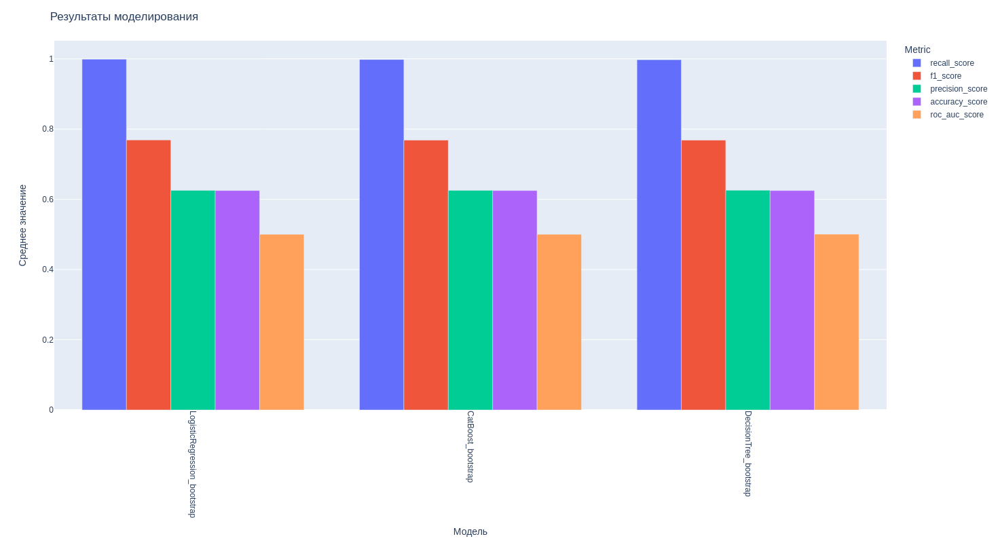

In [42]:
import pandas as pd
import plotly.express as px
import plotly.io as pio



# Создаем столбчатую диаграмму
fig = px.bar(df, x='model', y='Mean Value', color='Metric', barmode='group')

# Настраиваем диаграмму
fig.update_layout(
    title='Результаты моделирования',
    xaxis_title='Модель',
    yaxis_title='Среднее значение',
    xaxis_tickangle=90,
    width=1200,
    height=800
)
fig.update_traces(textposition='outside')

# Выводим диаграмму
pio.show(fig)
